# Neural Network Amp Simulator Project

Karl-Ingmar Adamson

Hendrik Parik

## Idea and motivation

Modern day guitar players and producers do not have to rely exclusively on expensive physical hardware to amplify and modulate guitar signals anymore, as there are extensive Virtual Studio Technology (VST) libraries to choose from. There are two main approaches to virtual amp modeling: white box modeling, which relies on mathematical modeling of individual electronic components (resistors, capacitors, tubes, transformers) based on known circuit schematics, and black box modeling, which treats the amplifier as an unknown system and learns its input-output relationship directly from recorded audio pairs using neural networks.

[Neural Amp Modeler](https://https://www.neuralampmodeler.com/) is a popular platform among musicians that offers the possibility for users to train their own models based on the users' recordings (input/output pair) and to share these models. This platform served as an inspiration to us for this project: to create our own model and train it with data we record ourselves.

## Objectives

- Create and train a model that can approximate the response of a simple solid-state practice amplifier for non-realtime processing.

- Compare different model types: Temporal Convolutional Network (TCN) and Gated Recurrent Unit (GRU) in terms of validation loss and inference time.

- Find optimal architecture configuration for both model types in terms of validation loss.

- Find out how trainable parameter count affects validation loss and inference time.

- Aurally compare three audio segments: the true amplifier output, the TCN prediction, and the GRU prediction for the same input.

## Data Collection, Preprocessing and Training

Recording setup is pictured below:



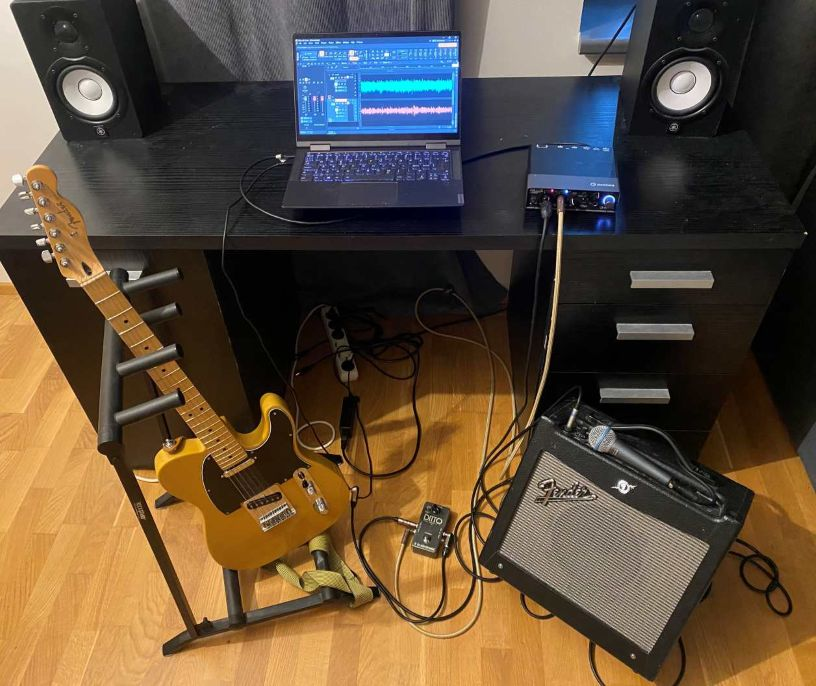



Data was collected by recording a 'dry' direct input (DI) signal and a 'wet' amplifier output signal simultaneously. Since the wet signal chain was longer, manual alignment of the signals was needed to compensate for the latency. Both files were split to get training and validation data.  

For training and validation, the data was divided into segments (a fixed size vector of consecutive samples). These segments were sampled randomly during training and deterministically while validating to ensure consistent validation across epochs.

The objective function was a combination of error-to-signal ratio which is a time domain metric, and spectral loss which compares signals' frequency content. This frequency-domain metric aligns better with human auditory perception.

## Experiments

A parameter search was done for both model types: across stacks, channels and learning rates for TCN and across hidden layer sizes, depth and learning rate for GRU. The search was not a full grid search, but a sequential search.

During initial search the models were trained for 20 epochs, after finding the optimal configuration for both model types, the optimal TCN and the optimal GRU were trained for 100 epochs or less if the validation loss stopped improving earlier. For each configuration the number of parameters and inference time (on a fixed number of random vectors) was recorded.

## Results

### TCN

| Parameter | Values Searched | Optimal Value |
|-----------|----------------|---------------|
| Channels | 8, 16, 32, 64 | **32** |
| Stacks | 1, 2, 3, 4 | **4** |
| Learning Rate | 2e-3, 1e-3, 5e-4, 2e-4, 1e-4 | **0.002** |

<br>

#### Training and validation loss for optimal TCN configuration

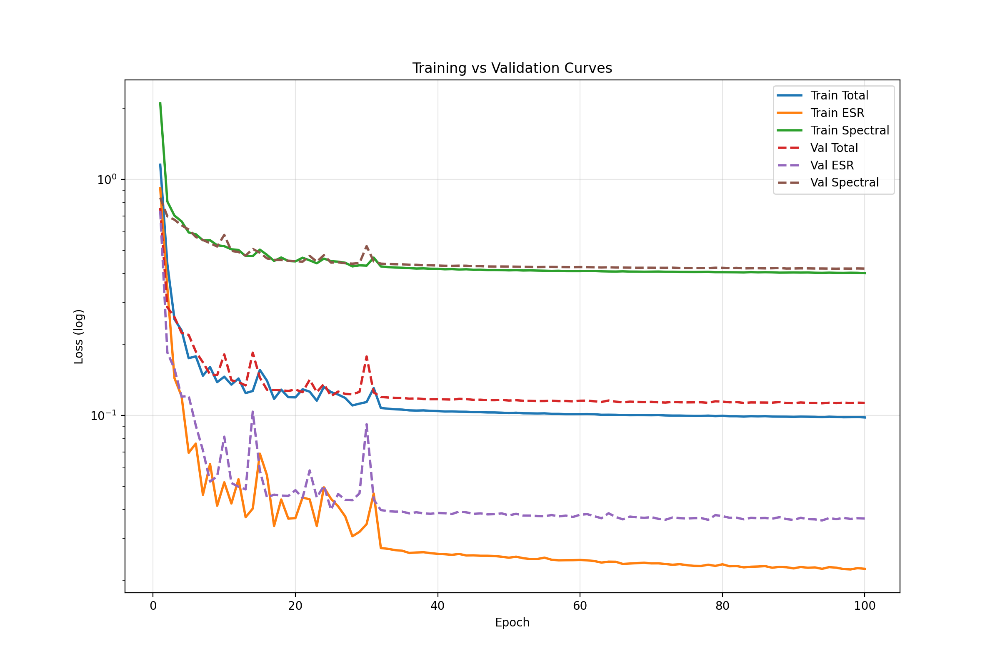

The validation spectral loss plateaued at around 0.41 and the error-to-signal ratio at around 0.036.

### GRU

| Parameter | Values Searched | Optimal Value |
|-----------|----------------|---------------|
| Hidden layer size | 32, 64, 128 | **128** |
| Layers | 1, 2, 3 | **3** |
| Learning Rate | 2e-3, 1e-3, 5e-4, 2e-4| **2e-3** |

<br>

#### Training and validation loss for optimal GRU configuration

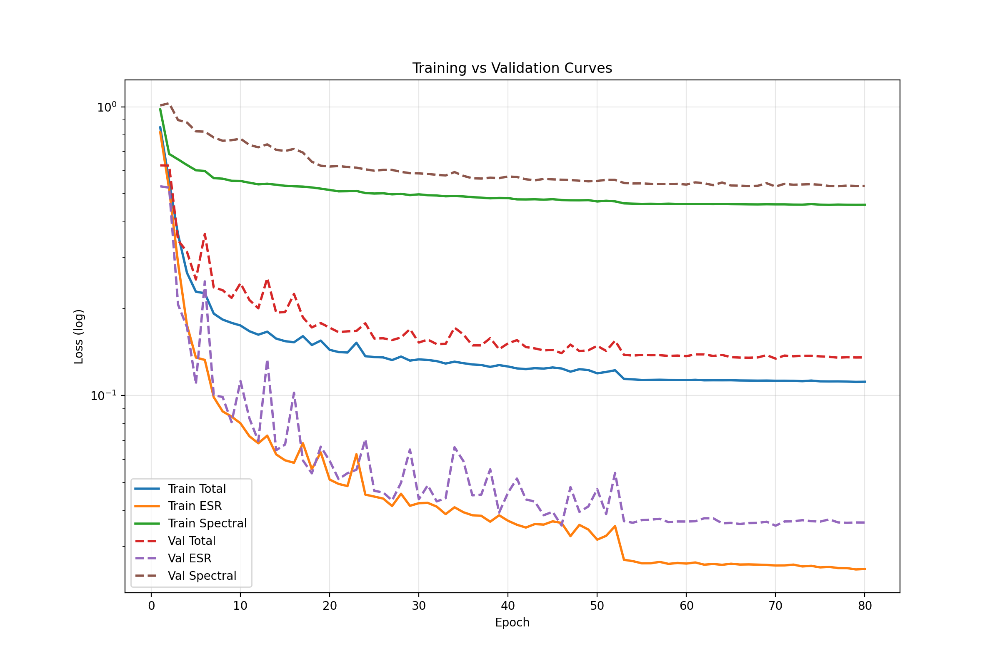

The validation spectral loss plateaued at around 0.53 and the error-to-signal ratio at around 0.036.

We can see that in general for both model types more complicated models were preferred although increasing channel size from 32 to 64 for the TCN did not yield better results. Notably both models exhibited sharp drop-off and subsequent stabilization in validation loss at surprisingly late stages of training.

### Validation loss and inference time as a function of model size

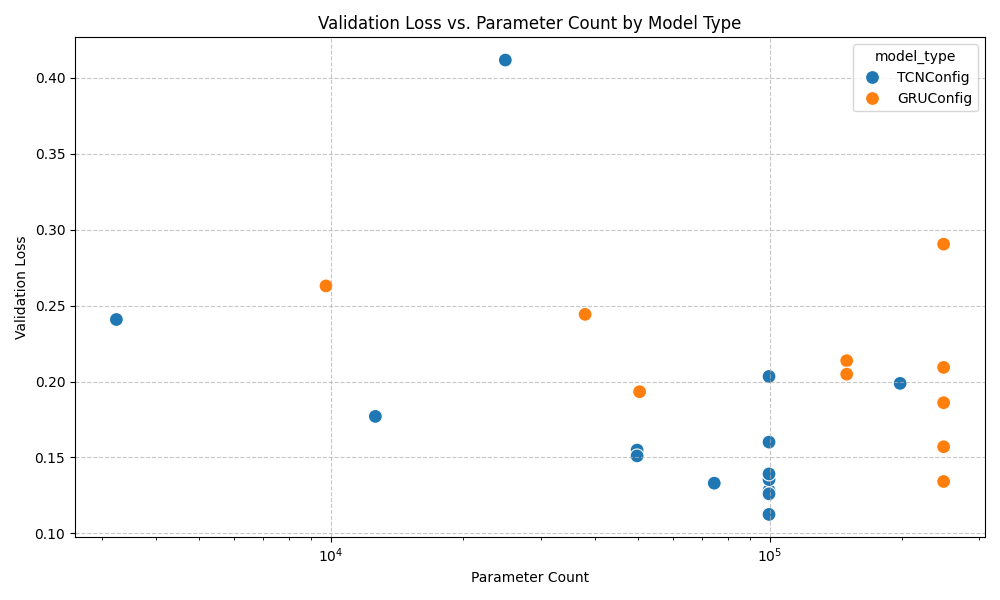

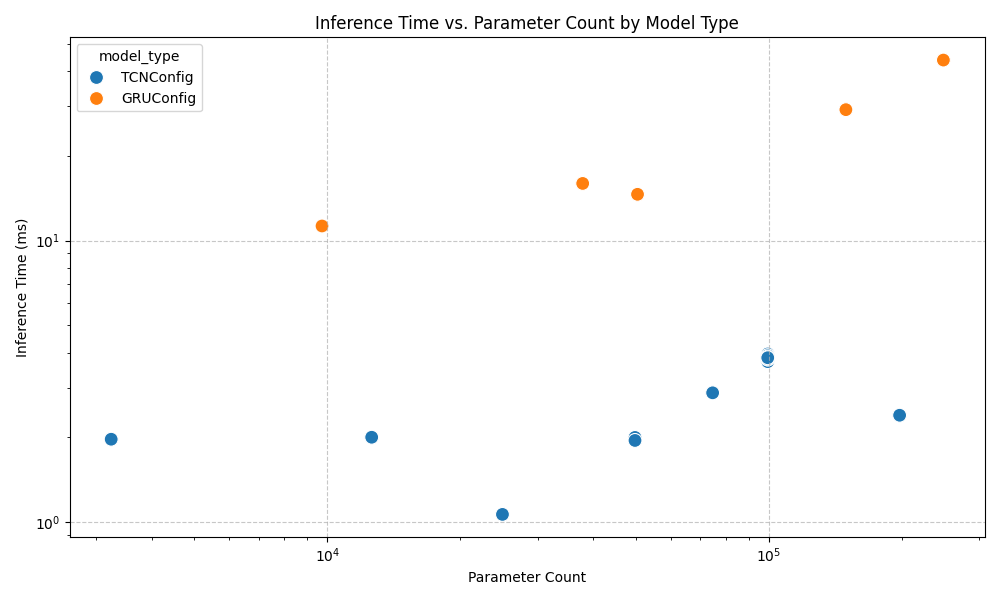

The models' inference times were tested on a single A100 GPU. While it is not a realistic deployment environment it provided a controlled environment for comparison.
Although the obtained dataset is quite noisy we can see that increasing the model size makes for more accurate but slower models. TCN performed better in terms of both inference speed and accuracy.

### Listen and Compare

See the audible differences in the true output, TCN prediction, GRU prediction and the prediction of the model from Neural Amp Modeler platform, compared on a segment of validation data.

In [1]:
import gdown
from IPython.display import Audio

files = {
    "true_output": "1JwE_qrNZ9em16TTrw9X4S-VroFx-QDsx",
    "tcn_output": "1UvFM-PAmSj83x39p-XyEyHqJICc28HR6",
    "gru_output": "15hRLAd0eBVTGQWQnkSeBxJaWf1Q5Z9Oq",
    "nam_output": "1KCZqwyFqHyX-Bb3ql3AjJAruAw5ABmlz"
}

for name, file_id in files.items():
    gdown.download(f"https://drive.google.com/uc?id={file_id}", f"{name}.wav", quiet=True)

print("True Output")
display(Audio('true_output.wav'))
print("TCN Output")
display(Audio('tcn_output.wav'))
print("GRU Output")
display(Audio('gru_output.wav'))
print("NAM Output")
display(Audio('nam_output.wav'))


True Output


TCN Output


GRU Output


NAM Output


We can hear that the TCN predicted output is close, but loses some brightness, and the GRU predicted output is even less bright compared to the TCN output. The Neural Amp Modeler output however is almost identical to the true output.

### Further Research Questions

We used a combined loss that weighed error-to-signal ratio considerably more (0.8 vs 0.2 for spectral loss). Could a more optimal weight combination produce a more realistic model?

We used GRU models where the feature expansion took place internally in the GRU, exclusively as hidden states. How would adding a convolutional layer before the first GRU layer affect model performance.